# Métodos de Ensambles

**XGBoost y Random Forest**

- A lo largo del colab vamos a trabajar con el siguiente dataset del clima:

https://www.kaggle.com/jsphyg/weather-dataset-rattle-package

El objetivo de este analisis será predecir si lloverá o no al día siguiente.

## 1. EDA y Preprocesamiento

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.tree import DecisionTreeClassifier
import sklearn.metrics as metrics
from sklearn.model_selection import learning_curve
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Montamos el drive antes de cargar el dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. Abrir el dataset

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/....../Weather.csv')
data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,0.0,No
142189,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,0.0,No
142190,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,0.0,No
142191,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,0.0,No


Contamos cuántos valores no-nulos hay

In [ ]:
data.count().sort_values()

,0
Sunshine,74377
Evaporation,81350
Cloud3pm,85099
Cloud9am,88536
Pressure9am,128179
Pressure3pm,128212
WindDir9am,132180
WindGustDir,132863
WindGustSpeed,132923
WindDir3pm,138415


2. Descartar las columnas que no nos interesan, entre ellas las que tienen pocos datos (menos de cien mil). Además, descartar 'Location' y 'Date', ya que no nos interesa el lugar ni fecha (al menos en este análisis), y 'RISK_MM', porque es un *leak*. **Para googlear**: ¿qué es un leak?

In [ ]:
columnas_descartables = ['Sunshine','Evaporation','Cloud3pm','Cloud9am','Location','RISK_MM','Date']
data = data.drop(columns=columnas_descartables)
data.shape

(142193, 17)

3. Descartar todas las filas que tengan valores nulos.

In [ ]:
data = data.dropna()
print(data.shape)
data

(112925, 17)


,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,No,No
1,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,No,No
2,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,No,No
3,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,No,No
4,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,0.0,E,31.0,ESE,E,15.0,13.0,59.0,27.0,1024.7,1021.2,9.4,20.9,No,No
142189,2.8,23.4,0.0,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,10.1,22.4,No,No
142190,3.6,25.3,0.0,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,10.9,24.5,No,No
142191,5.4,26.9,0.0,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,12.5,26.1,No,No


4. Para simplificar el preprocesamiento, también descartar todas las columnas que tengan valores categóricos.

In [ ]:
columnas_descartables = ['WindGustDir','WindDir9am','WindDir3pm','RainToday']
data = data.drop(columns=columnas_descartables)
data

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainTomorrow
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,No
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,No
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,No
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,No
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,0.0,31.0,15.0,13.0,59.0,27.0,1024.7,1021.2,9.4,20.9,No
142189,2.8,23.4,0.0,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,10.1,22.4,No
142190,3.6,25.3,0.0,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,10.9,24.5,No
142191,5.4,26.9,0.0,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,12.5,26.1,No


5. Realizar un countplot para ver cuántos casos hay de lluvia y no-lluvia.

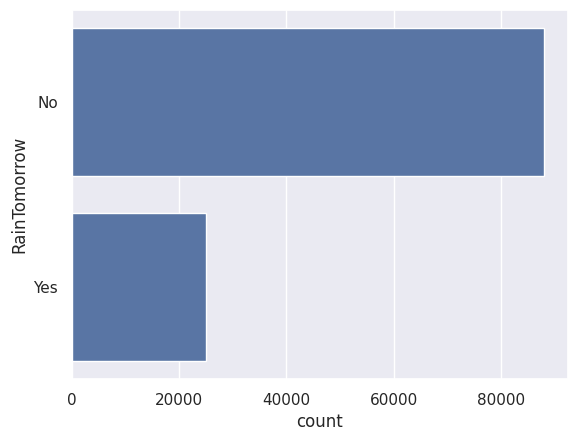

In [ ]:
sns.countplot(data.RainTomorrow)
plt.show()

Y hacer el `pairplot` para ver cómo se relacionan las variables. Recuerden que este gráfico puede llevar bastante tiempo. También recuerden que pueden agrandar el gráfico haciendo click sobre él.

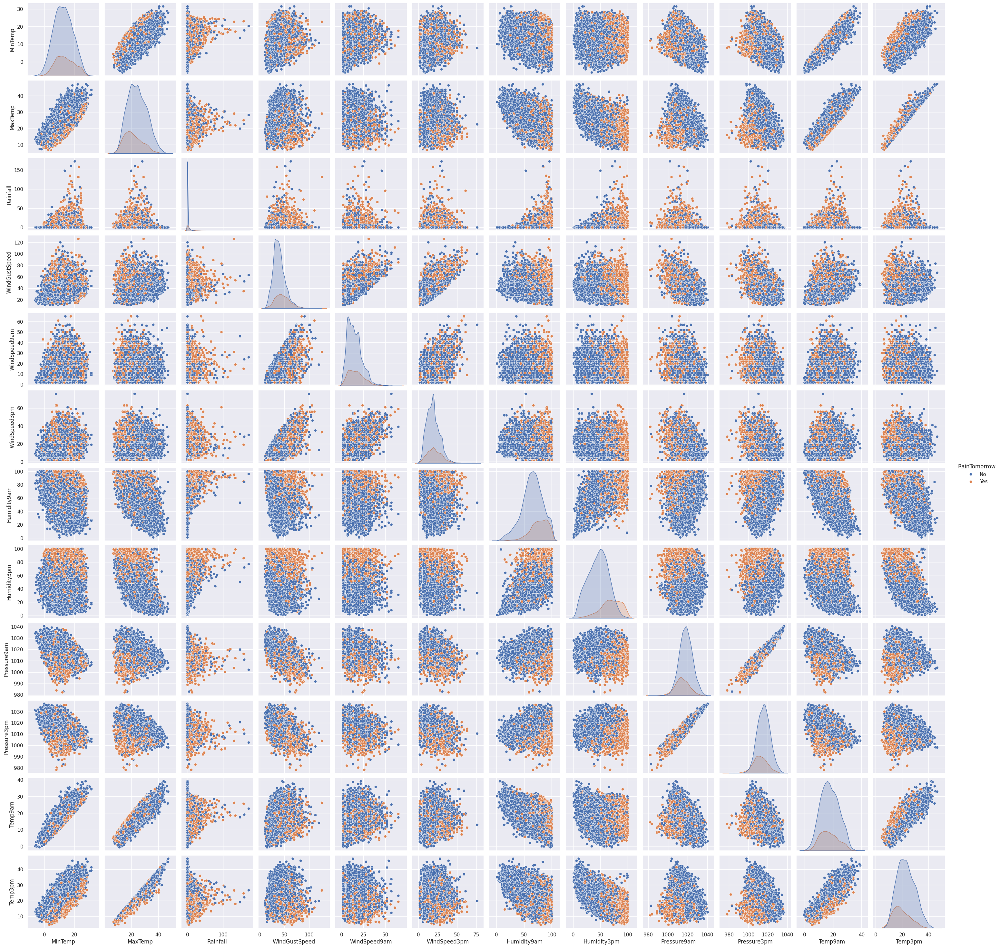

In [ ]:
sns.pairplot(data.sample(frac = 0.1), hue = 'RainTomorrow')

Hay algunas que parecen *correlacionadas*. Tratemos de cuantificarlo.

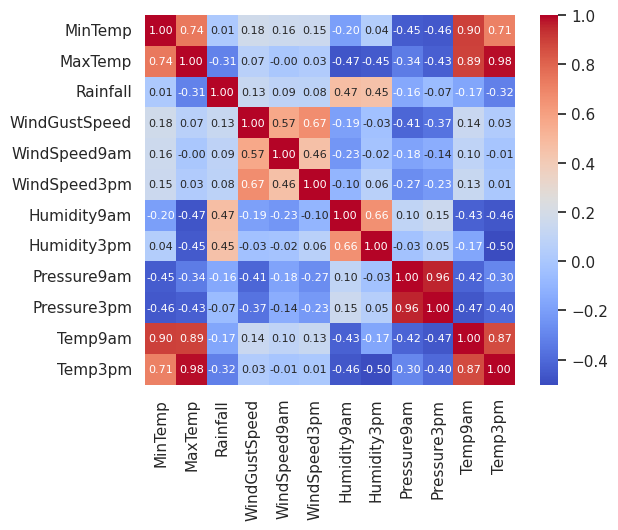

<Figure size 1000x1000 with 0 Axes>

In [ ]:
corr = data.drop(columns = ['RainTomorrow']).corr(method='spearman')

sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 8},
           xticklabels= data.drop(columns = ['RainTomorrow']).columns,
           yticklabels= data.drop(columns = ['RainTomorrow']).columns,
           cmap= 'coolwarm')

plt.figure(figsize=(10,10))
plt.show()

En base a la correlación, podemos descartar (o no) algunas variables. **Para pensar**, ¿por qué haríamos (o no) esto?

In [ ]:
data = data.drop(columns=['Temp3pm', 'Pressure9am'])

In [ ]:
data

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Temp9am,RainTomorrow
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.1,16.9,No
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1007.8,17.2,No
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1008.7,21.0,No
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1012.8,18.1,No
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1006.0,17.8,No
...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,0.0,31.0,15.0,13.0,59.0,27.0,1021.2,9.4,No
142189,2.8,23.4,0.0,31.0,13.0,11.0,51.0,24.0,1020.3,10.1,No
142190,3.6,25.3,0.0,22.0,13.0,9.0,56.0,21.0,1019.1,10.9,No
142191,5.4,26.9,0.0,37.0,9.0,9.0,53.0,24.0,1016.8,12.5,No


6. Llevar `RainTomorrow` a una variable númerica

In [ ]:
data['RainTomorrow'] = data['RainTomorrow'].map({'Yes':1,'No':0})

In [ ]:
# Pongo en una nueva variable el dataset final de trabajo
data_trabajo = data
data_trabajo

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Temp9am,RainTomorrow
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.1,16.9,0
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1007.8,17.2,0
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1008.7,21.0,0
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1012.8,18.1,0
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1006.0,17.8,0
...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,0.0,31.0,15.0,13.0,59.0,27.0,1021.2,9.4,0
142189,2.8,23.4,0.0,31.0,13.0,11.0,51.0,24.0,1020.3,10.1,0
142190,3.6,25.3,0.0,22.0,13.0,9.0,56.0,21.0,1019.1,10.9,0
142191,5.4,26.9,0.0,37.0,9.0,9.0,53.0,24.0,1016.8,12.5,0


### Datos de entrenamiento y casos *benchmark*

Un primer y simple acercamiento. Generamos casos base contra los cuales comparar nuestros resultados.

1. Elegir variables de entrenamiento (empezar con dos) y separar las etiquetas

In [ ]:
columnas_entrenamiento = ['MaxTemp', 'Humidity3pm']
X = data_trabajo[columnas_entrenamiento]
y = data_trabajo.RainTomorrow

In [ ]:
X
#y

,MaxTemp,Humidity3pm
0,22.9,22.0
1,25.1,25.0
2,25.7,30.0
3,28.0,16.0
4,32.3,33.0
...,...,...
142188,21.8,27.0
142189,23.4,24.0
142190,25.3,21.0
142191,26.9,24.0


2. Generar un modelo que diga siempre que NO va a llover y medir su exactitud.

In [ ]:
#Todos Ceros = NO va a llover
y_pred = np.zeros(y.shape)
accuracy_ceros = metrics.accuracy_score(y,y_pred)
print(accuracy_ceros)

0.7784458711534205


Y generar otro modelo que diga siempre que va a llover y medir su exactitud.

In [ ]:
#Todos Unos = va a llover
y_pred = np.ones(y.shape)
accuracy_unos = metrics.accuracy_score(y,y_pred)
print(accuracy_unos)

0.2215541288465796


3. Desafío:  Entrena un árbol de decisión sobre este dataset. Intenta obtener el mejor desempeño que creas posible, optimizando sus hiperparámetros.

In [ ]:
X_ch = data_trabajo.drop(['RainTomorrow'], axis=1)
y_ch = data_trabajo.RainTomorrow

In [ ]:
X_ch

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Temp9am
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.1,16.9
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1007.8,17.2
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1008.7,21.0
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1012.8,18.1
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1006.0,17.8
...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,0.0,31.0,15.0,13.0,59.0,27.0,1021.2,9.4
142189,2.8,23.4,0.0,31.0,13.0,11.0,51.0,24.0,1020.3,10.1
142190,3.6,25.3,0.0,22.0,13.0,9.0,56.0,21.0,1019.1,10.9
142191,5.4,26.9,0.0,37.0,9.0,9.0,53.0,24.0,1016.8,12.5


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_ch, y_ch, stratify=y_ch, random_state=42)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()

In [ ]:
param_grid_clf = {"max_depth": np.arange(1, 10, 2),
              "min_samples_leaf": [1, 5, 10, 20], #puede ir de 1 a 20
              "min_samples_split": [1, 5, 10, 30], #puede ir de 1 a 40
              "criterion": ["gini", "entropy"]}

In [ ]:
from sklearn.model_selection import GridSearchCV

# ESTRATEGIA 1: Grid Search
model_cfl = GridSearchCV(clf, param_grid=param_grid_clf, cv=5) #5 folders

# Entrenamos: tree con la grilla definida arriba y CV con tamaño de Fold=5
model_cfl.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([1, 3, 5, 7, 9]),
                         'min_samples_leaf': [1, 5, 10, 20],
                         'min_samples_split': [1, 5, 10, 30]})

In [ ]:
print("Mejores parametros: "+str(model_cfl.best_params_))
print("Mejor Score: "+str(model_cfl.best_score_)+'\n')

scores = pd.DataFrame(model_cfl.cv_results_)
scores

Mejores parametros: {'criterion': 'entropy', 'max_depth': np.int64(7), 'min_samples_leaf': 1, 'min_samples_split': 5}
Mejor Score: 0.8443673136876836



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.008389,0.002081,0.000000,0.000000,gini,1,1,1,"{'criterion': 'gini', 'max_depth': 1, 'min_sam...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,121
1,0.073337,0.005662,0.004725,0.000101,gini,1,1,5,"{'criterion': 'gini', 'max_depth': 1, 'min_sam...",0.821064,0.821772,0.826141,0.811312,0.811784,0.818415,0.005872,97
2,0.069874,0.001812,0.004690,0.000236,gini,1,1,10,"{'criterion': 'gini', 'max_depth': 1, 'min_sam...",0.821064,0.821772,0.826141,0.811312,0.811784,0.818415,0.005872,97
3,0.071637,0.002194,0.004729,0.000240,gini,1,1,30,"{'criterion': 'gini', 'max_depth': 1, 'min_sam...",0.821064,0.821772,0.826141,0.811312,0.811784,0.818415,0.005872,97
4,0.005959,0.000193,0.000000,0.000000,gini,1,5,1,"{'criterion': 'gini', 'max_depth': 1, 'min_sam...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,0.410321,0.010153,0.004873,0.000085,entropy,9,10,30,"{'criterion': 'entropy', 'max_depth': 9, 'min_...",0.842612,0.841018,0.843497,0.842839,0.840949,0.842183,0.001022,40
156,0.003268,0.000135,0.000000,0.000000,entropy,9,20,1,"{'criterion': 'entropy', 'max_depth': 9, 'min_...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,121
157,0.396834,0.007942,0.004877,0.000043,entropy,9,20,5,"{'criterion': 'entropy', 'max_depth': 9, 'min_...",0.843143,0.841313,0.843202,0.843311,0.842307,0.842655,0.000760,25
158,0.500334,0.083704,0.005851,0.000671,entropy,9,20,10,"{'criterion': 'entropy', 'max_depth': 9, 'min_...",0.843143,0.841313,0.843202,0.842898,0.842366,0.842584,0.000701,26


In [ ]:
#Test
from sklearn.metrics import confusion_matrix, accuracy_score

prediction_clf_test = model_cfl.predict(X_test)
print('Exactitud:', accuracy_score(y_test, prediction_clf_test))

Exactitud: 0.845423632757155


In [ ]:
#Train
from sklearn.metrics import confusion_matrix, accuracy_score

prediction_clf_train = model_cfl.predict(X_train)
print('Exactitud:', accuracy_score(y_train, prediction_clf_train))

Exactitud: 0.849361812664565


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
# Matriz de Confusion
cm = confusion_matrix(y_test,prediction_clf_test)
print("Matriz de confusión:")
print(cm)

Matriz de confusión:
[[20765  1212]
 [ 3152  3103]]


In [ ]:
# Reporte de Clasificacion
report = classification_report(y_test, prediction_clf_test)
print("Reporte de Clasificación:")
print(report)

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     21977
           1       0.72      0.50      0.59      6255

    accuracy                           0.85     28232
   macro avg       0.79      0.72      0.75     28232
weighted avg       0.84      0.85      0.83     28232



### 1. XGBoost - Boosting

Instalar y entrenar un modelo con `XGBoost` con el mismo dataset

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import validation_curve
from sklearn.metrics import classification_report

In [ ]:
X_xgb = data_trabajo.drop(['RainTomorrow'], axis=1)
y_xgb = data_trabajo.RainTomorrow

In [ ]:
# Separamos los datos en train y test (held-out) - Utilice un 30% del dataset como test
X_train, X_test, y_train, y_test = train_test_split(X_xgb, y_xgb, test_size=0.30, random_state=42, stratify = y_xgb)

In [ ]:
XGB_clf = XGBClassifier(n_estimators=250, max_depth=2)
# Entrenamos el modelo
XGB_clf.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=2,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=250,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_train_pred = XGB_clf.predict(X_train)
y_test_pred = XGB_clf.predict(X_test)
print('Accuracy sobre el train set: ', accuracy_score(y_train, y_train_pred))
print('Accuracy sobre el test set: ', accuracy_score(y_test, y_test_pred))

Accuracy sobre el train set:  0.856591648006882
Accuracy sobre el test set:  0.8546549383080465


Optimizamos hiperparámetros

In [ ]:
# A parameter grid for XGBoost
parameters= {'min_child_weight': [1, 10],
             'gamma': [0.5, 5],
             'subsample': [0.6, 1.0],
             'colsample_bytree': [0.6, 1.0],
             'max_depth': [3, 5]
            }

#Proba tambien con los hiperparametros: alpha (α o L1) y lambda (λ o L2).
# https://www.geeksforgeeks.org/machine-learning/xgboost-parameters/

In [ ]:
from sklearn.model_selection import GridSearchCV

# Grid Search
modelXGB_cfl = GridSearchCV(XGB_clf, param_grid=parameters, cv=5) #5 folders

In [ ]:
# Entrenamos: tree con la grilla definida arriba y CV con tamaño de Fold=5
modelXGB_cfl.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, feature_weights=None,
                                     gamma=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=Non...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=2,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=250,
                                     n_jobs=None, num_parallel_tree=None, ...),
             param_grid={'colsample_bytree': [0.6, 1.0], 'gamma': [0.5, 5],
                         'max_depth': [3, 5], 'min_child_weight': [1, 10],
                         'subsample': [0.6, 1.0]})

In [ ]:
print("Mejores parametros: "+str(modelXGB_cfl.best_params_))
print("Mejor Score: "+str(modelXGB_cfl.best_score_)+'\n')

scores = pd.DataFrame(modelXGB_cfl.cv_results_)
scores

Mejores parametros: {'colsample_bytree': 1.0, 'gamma': 5, 'max_depth': 3, 'min_child_weight': 10, 'subsample': 0.6}
Mejor Score: 0.8524169448631111



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_gamma,param_max_depth,param_min_child_weight,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.041879,0.010388,0.058135,0.000337,0.6,0.5,3,1,0.6,"{'colsample_bytree': 0.6, 'gamma': 0.5, 'max_d...",0.851107,0.849209,0.852426,0.851540,0.850971,0.851051,0.001052,22
1,1.462486,0.877117,0.061765,0.016205,0.6,0.5,3,1,1.0,"{'colsample_bytree': 0.6, 'gamma': 0.5, 'max_d...",0.852878,0.849715,0.853881,0.850718,0.853564,0.852151,0.001643,3
2,1.035606,0.016483,0.062425,0.006624,0.6,0.5,3,10,0.6,"{'colsample_bytree': 0.6, 'gamma': 0.5, 'max_d...",0.852182,0.849968,0.851414,0.852426,0.853754,0.851949,0.001245,6
3,0.896903,0.210097,0.061422,0.024507,0.6,0.5,3,10,1.0,"{'colsample_bytree': 0.6, 'gamma': 0.5, 'max_d...",0.851107,0.850601,0.853375,0.850844,0.854260,0.852037,0.001489,5
4,1.962721,1.165342,0.112997,0.027817,0.6,0.5,5,1,0.6,"{'colsample_bytree': 0.6, 'gamma': 0.5, 'max_d...",0.847502,0.845667,0.849579,0.846353,0.848251,0.847471,0.001383,31
5,0.838866,0.053135,0.064962,0.014117,0.6,0.5,5,1,1.0,"{'colsample_bytree': 0.6, 'gamma': 0.5, 'max_d...",0.851297,0.850411,0.851667,0.853375,0.853691,0.852088,0.001252,4
6,2.000128,1.308014,0.091760,0.001077,0.6,0.5,5,10,0.6,"{'colsample_bytree': 0.6, 'gamma': 0.5, 'max_d...",0.847185,0.849020,0.849073,0.846670,0.848378,0.848065,0.000974,29
7,0.805152,0.026776,0.058994,0.011741,0.6,0.5,5,10,1.0,"{'colsample_bytree': 0.6, 'gamma': 0.5, 'max_d...",0.851486,0.850791,0.850085,0.851857,0.852616,0.851367,0.000870,16
8,1.521515,1.239408,0.051232,0.008839,0.6,5.0,3,1,0.6,"{'colsample_bytree': 0.6, 'gamma': 5, 'max_dep...",0.851044,0.849905,0.853311,0.852299,0.851920,0.851696,0.001154,11
9,0.656282,0.019757,0.041571,0.008013,0.6,5.0,3,1,1.0,"{'colsample_bytree': 0.6, 'gamma': 5, 'max_dep...",0.850664,0.847755,0.853311,0.851161,0.851224,0.850823,0.001784,23


In [ ]:
#Mejor modelo optimizado
XGB_clf = XGBClassifier(colsample_bytree= 1.0, gamma= 5, max_depth= 5, min_child_weight= 10, subsample= 1.0)

In [ ]:
# Entrenamos el modelo
XGB_clf.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=5, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=10, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_train_pred = XGB_clf.predict(X_train)
y_test_pred = XGB_clf.predict(X_test)
print('Accuracy sobre el train set: ', accuracy_score(y_train, y_train_pred))
print('Accuracy sobre el test set: ', accuracy_score(y_test, y_test_pred))

Accuracy sobre el train set:  0.8569079155439169
Accuracy sobre el test set:  0.8539760316429541


## Veamos como da la curva de validacion

In [ ]:
n_estimators_range = np.linspace(1, 200, 10).astype('int')

train_scores, test_scores = validation_curve(
    XGBClassifier(n_estimators=n_estimators_range),
    X_train, y_train,
    param_name = 'n_estimators',
    param_range = n_estimators_range,
    cv=5,
    scoring='accuracy'
)

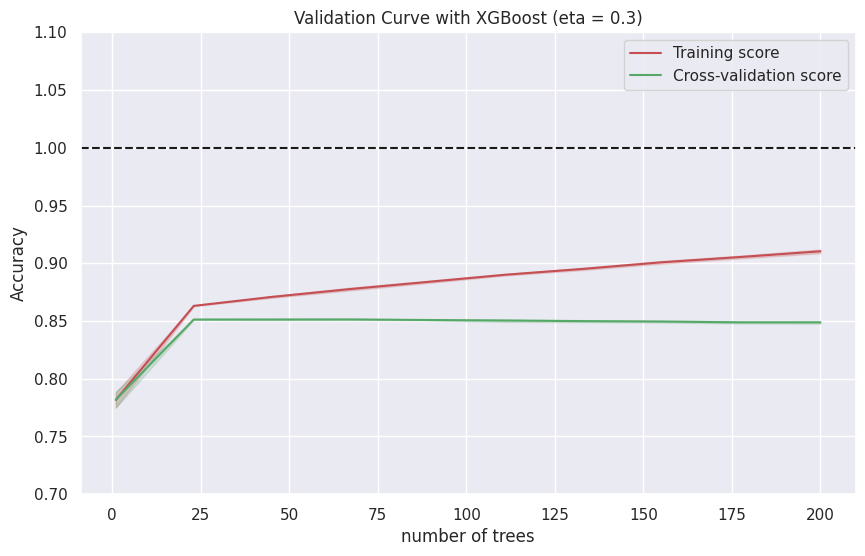

In [ ]:
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

fig = plt.figure(figsize=(10, 6), dpi=100)

plt.title("Validation Curve with XGBoost (eta = 0.3)")
plt.xlabel("number of trees")
plt.ylabel("Accuracy")
plt.ylim(0.7, 1.1)

plt.plot(n_estimators_range,
             train_scores_mean,
             label="Training score",
             color="r")

plt.plot(n_estimators_range,
             test_scores_mean,
             label="Cross-validation score",
             color="g")

plt.fill_between(n_estimators_range,
                 train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std,
                 alpha=0.2, color="r")

plt.fill_between(n_estimators_range,
                 test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std,
                 alpha=0.2, color="g")

plt.axhline(y=1, color='k', ls='dashed')

plt.legend(loc="best")
plt.show()

i = np.argmax(test_scores_mean)
#print("Best cross-validation result ({0:.2f}) obtained for {1} trees".format(test_scores_mean[i], n_estimators_range[i]))

## 2. Random Forest

Random Forest, es capaz de seleccionar *features* al azar, y de esa manera,hace mas independientes o 'descorrelaciona' aún más los distintos modelos de árboles creados.

1. Importar de scikit-learn el modelo `RandomForestClassifier`

In [ ]:
from sklearn.ensemble import RandomForestClassifier

2. Investigar sus parámetros. En particular, `n_estimators`, `max_features` y `oob_score`. Luego, crear y entrenar un modelo en el conjunto de train.

In [ ]:
X_rf = data_trabajo.drop(['RainTomorrow'], axis=1)
y_rf = data_trabajo.RainTomorrow

In [ ]:
# Separamos los datos en train y test (held-out) - Utilice un 30% del dataset como test
X_train, X_test, y_train, y_test = train_test_split(X_rf, y_rf, test_size=0.30, random_state=42, stratify = y_rf)

In [ ]:
clf = RandomForestClassifier(n_estimators=100, max_features='sqrt', n_jobs=-1, oob_score = True, random_state = 42)
clf.fit(X_train,y_train)

# oob_score es importante ya que me dice cual modelo funciono mejor--compara el train y test que separo en cada subset de datos

RandomForestClassifier(n_jobs=-1, oob_score=True, random_state=42)

3. Evaluar su desempeño en el conjunto de train y de test.

In [ ]:
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
print(metrics.accuracy_score(y_train, y_train_pred))
print(metrics.f1_score(y_test, y_test_pred))

1.0
0.6167857423255083


4. ¿Cuál es su `oob_score_`?¿Y que son `feature_importances_`?

In [ ]:
clf.oob_score_

0.8504940098928485

In [ ]:
clf.feature_importances_

array([0.08295727, 0.08656139, 0.08480557, 0.08657568, 0.05533196,
       0.05879001, 0.09608163, 0.2511166 , 0.117106  , 0.08067388])

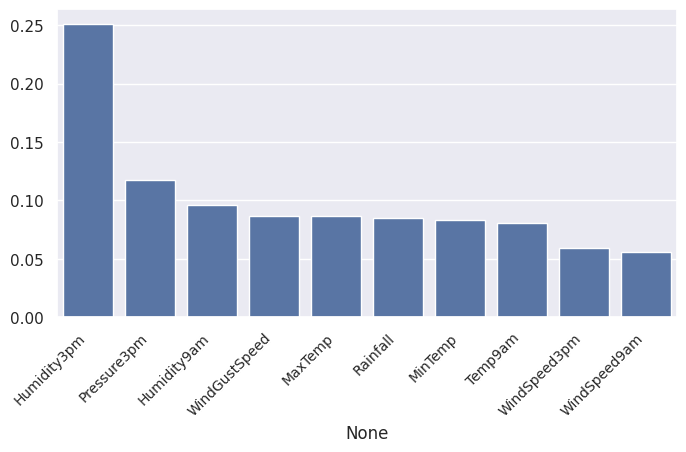

In [ ]:
importances = clf.feature_importances_
columns = X_train.columns
indices = np.argsort(importances)[::-1]

plt.figure(figsize = (8,4))
plt.xticks(rotation=45, ha='right', fontsize=10)
sns.barplot(x=columns[indices], y=importances[indices])
plt.show()

5. ¿Qué hay en la propiedad `estimators_`?

In [ ]:
#clf.estimators_
clf.estimators_[25]

DecisionTreeClassifier(max_features='sqrt', random_state=151881004)

6. Elegir uno de los `estimators` y evaluar su desempeño sobre train y test.

In [ ]:
clf_tree = clf.estimators_[25]
clf_tree.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': 151881004,
 'splitter': 'best'}

In [ ]:
y_train_pred = clf_tree.predict(X_train)
y_test_pred = clf_tree.predict(X_test)
print(metrics.accuracy_score(y_train, y_train_pred))
print(metrics.accuracy_score(y_test, y_test_pred))

0.9185421331612837
0.7810673593482496


¿Está overfiteado?¿Por qué la accuracy sobre el conjunto de train no es 1?

7. Grafico la curva de validación/complejidad para un modelo Random Forest en función del número de estimadores. No usamos CV porque puede llevar bastante tiempo.
Además, obtener su oob_score para graficar en la curva de complejidad (No se preocupen por los mensajes de warning).

In [ ]:
train_accuracy = []
test_accuracy = []
oob_scores = []

N_estimadores = [1, 2, 3, 4, 5, 10, 25, 50, 100, 250, 500, 1000]

for estimadores in N_estimadores:
    print(estimadores)
    clf = RandomForestClassifier(n_estimators=estimadores, n_jobs=-1, oob_score= True, random_state = 42)
    clf.fit(X_train, y_train)

    y_train_pred = clf.predict(X_train)
    y_test_pred = clf.predict(X_test)

    # Cálculo de la precisión
    train_accuracy.append(accuracy_score(y_train, y_train_pred))
    test_accuracy.append(accuracy_score(y_test, y_test_pred))

    # Almacenamiento del OOB Score
    oob_scores.append(clf.oob_score_)

train_accuracy = np.array(train_accuracy)
test_accuracy = np.array(test_accuracy)
oob_scores = np.array(oob_scores)

1
2
3
4
5
10
25
50
100
250
500
1000


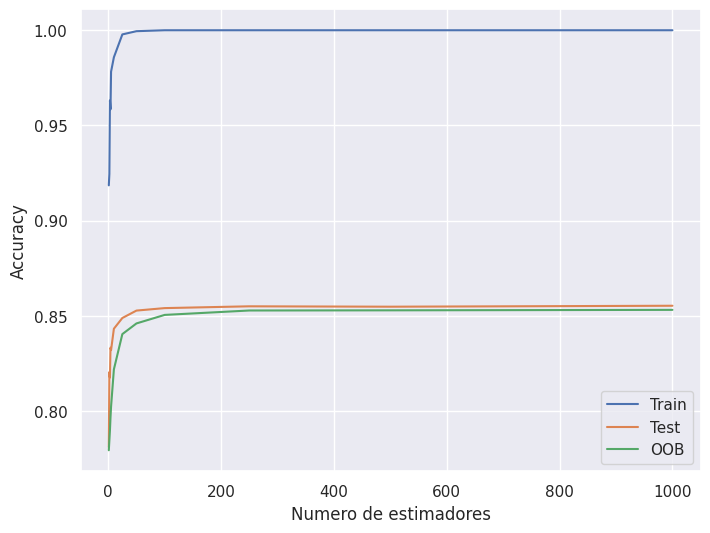

In [ ]:
plt.figure(figsize = (8,6))
plt.plot(N_estimadores, train_accuracy, label = 'Train')
plt.plot(N_estimadores, test_accuracy, label = 'Test')
plt.plot(N_estimadores, oob_scores, label = 'OOB')
plt.xlabel('Numero de estimadores')
plt.ylabel('Accuracy')
plt.legend()
# plt.xlim(0,50) # Puedes descomentar esta línea para hacer zoom en los primeros estimadores
plt.show()

8. Hacer y graficar la curva de aprendizaje para un modelo con 250 estimadores. Puede llevar bastante tiempo, no se preocupen (unos 15 minutos aprox).

In [ ]:
clf = RandomForestClassifier(n_estimators=250, n_jobs=-1, oob_score= True, random_state = 42)

train_sizes, train_scores, valid_scores = learning_curve(clf, X_train, y_train, train_sizes = np.linspace(0.0001,1,10), scoring = 'accuracy', cv=5)

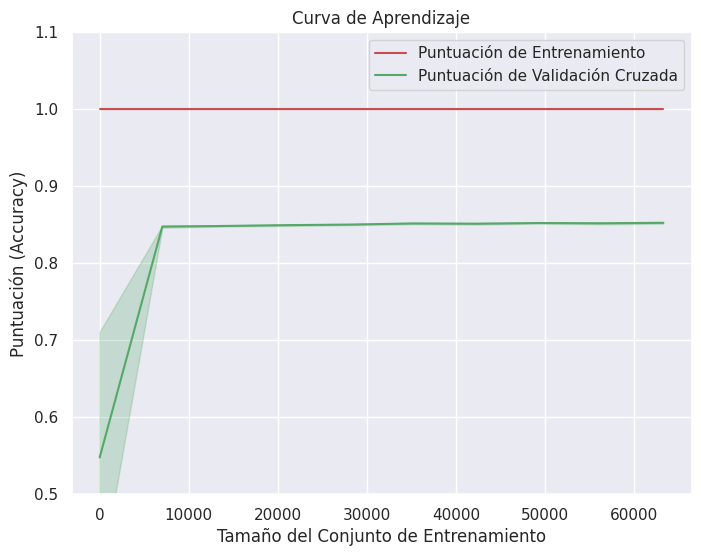

In [ ]:
plt.figure(figsize = (8,6))
plt.plot(train_sizes, train_scores.mean(axis = 1), color = 'r', label='Puntuación de Entrenamiento')
plt.plot(train_sizes, valid_scores.mean(axis = 1), color = 'g', label='Puntuación de Validación Cruzada')

# Rellenar el área de Desviación Estándar para Entrenamiento (Rojo)
plt.fill_between(train_sizes,
                 train_scores.mean(axis = 1) - train_scores.std(axis = 1),
                 train_scores.mean(axis = 1) + train_scores.std(axis = 1),
                 alpha=0.25,
                 color="r")

# Rellenar el área de Desviación Estándar para Validación (Verde)
plt.fill_between(train_sizes,
                 valid_scores.mean(axis = 1) - valid_scores.std(axis = 1),
                 valid_scores.mean(axis = 1) + valid_scores.std(axis = 1),
                 alpha=0.25, color="g")

plt.title('Curva de Aprendizaje')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Puntuación (Accuracy)')
plt.legend(loc="best")
plt.ylim(0.5,1.1)
plt.grid(True)
plt.show()

9. Pruebo con dos features, pueden graficar las fronteras de decisión.

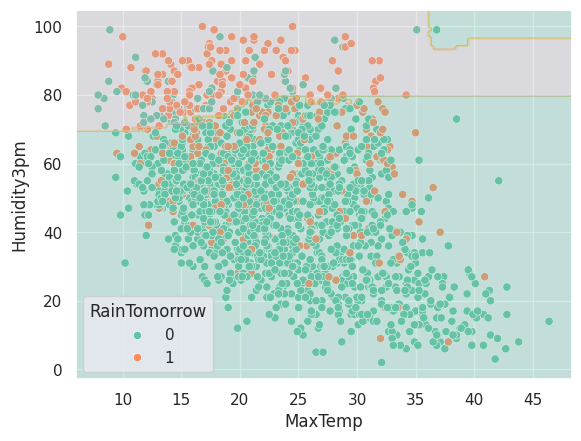

<Figure size 800x600 with 0 Axes>

In [ ]:
N = 20 #para no graficar todos los puntos y saturar el grafico
clf = RandomForestClassifier(n_estimators=250).fit(X_train, y_train)

# Preparar los datos para el scatterplot de forma segura
X_plot = X_test.iloc[::N].copy()
y_plot = y_test.iloc[::N].copy()

# Grafico Clasificador Sesgado (Scatterplot)
ax = sns.scatterplot(x='MaxTemp', y='Humidity3pm', hue=y_plot, data=X_plot, palette='Set2')
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Malla para la Región de Decisión
xx, yy = np.meshgrid(np.linspace(*xlim, num=200),
                     np.linspace(*ylim, num=200))

# Lógica para modelos multidimensionales (asume que X_test es un DataFrame)
feature_names = X_test.columns.tolist()
idx_maxtemp = feature_names.index('MaxTemp')
idx_humidity = feature_names.index('Humidity3pm')

# Crea un array base con la media de todas las características
fill_values = X_test.mean().values
X_base = np.tile(fill_values, (xx.size, 1))

# Sustituye solo las columnas a graficar
X_base[:, idx_maxtemp] = xx.ravel()
X_base[:, idx_humidity] = yy.ravel()

# Predecir con el array de entrada completo y plotear el contorno
Z = clf.predict(X_base).reshape(xx.shape)
contours = ax.contourf(xx, yy, Z, alpha=0.3, cmap = 'Set2')

plt.figure(figsize = (8,6))
plt.show()